In [333]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, VotingRegressor, StackingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.kernel_ridge import KernelRidge


In [154]:
train_df=pd.read_csv(r"C:\Users\Rohit Phougat\Desktop\house-prices-advanced-regression-techniques\train.csv")
test_df=pd.read_csv(r"C:\Users\Rohit Phougat\Desktop\house-prices-advanced-regression-techniques\test.csv")

In [155]:
train_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [156]:
train_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [157]:
train_df.dtypes[train_df.dtypes != "object"]

Id                 int64
MSSubClass         int64
LotFrontage      float64
LotArea            int64
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
MasVnrArea       float64
BsmtFinSF1         int64
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
1stFlrSF           int64
2ndFlrSF           int64
LowQualFinSF       int64
GrLivArea          int64
BsmtFullBath       int64
BsmtHalfBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr       int64
TotRmsAbvGrd       int64
Fireplaces         int64
GarageYrBlt      float64
GarageCars         int64
GarageArea         int64
WoodDeckSF         int64
OpenPorchSF        int64
EnclosedPorch      int64
3SsnPorch          int64
ScreenPorch        int64
PoolArea           int64
MiscVal            int64
MoSold             int64
YrSold             int64
SalePrice          int64
dtype: object

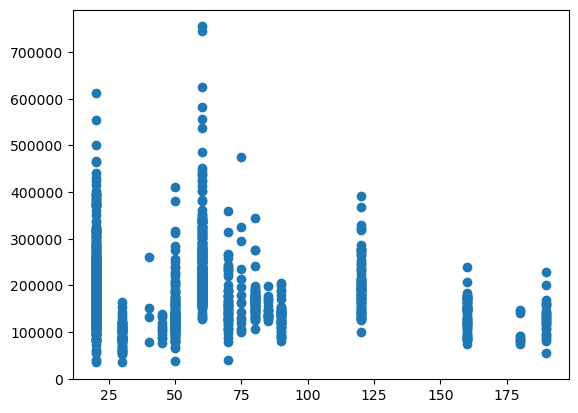

In [158]:
plt.scatter(x='MSSubClass', y='SalePrice', data=train_df) 

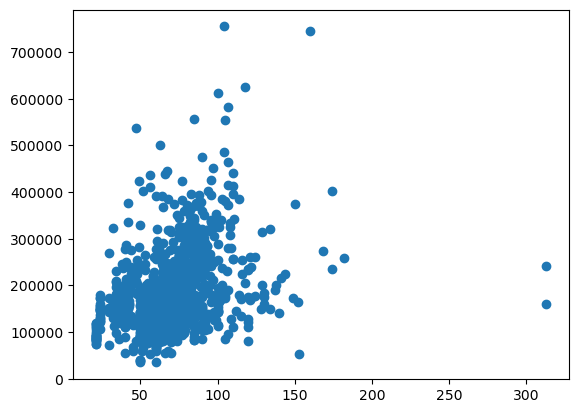

In [159]:
plt.scatter(x='LotFrontage', y='SalePrice', data=train_df)

In [160]:
train_df.query("LotFrontage > 300")
#Drop Id 935 and 1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
934,935,20,RL,313.0,27650,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,11,2008,WD,Normal,242000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


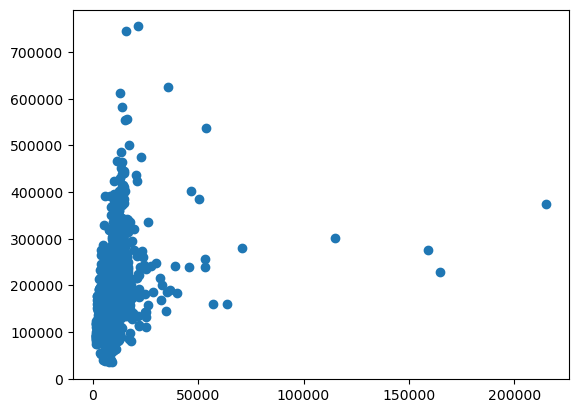

In [161]:
plt.scatter(x='LotArea', y='SalePrice', data=train_df)

In [162]:
train_df.query("LotArea > 55000")
#Drop Id 250,314,336,452,707
#maybe 1397

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
249,250,50,RL,NaN,159000,Pave,NaN,IR2,Low,AllPub,...,0,NaN,NaN,Shed,500,6,2007,WD,Normal,277000
313,314,20,RL,150.0,215245,Pave,NaN,IR3,Low,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,375000
335,336,190,RL,NaN,164660,Grvl,NaN,IR1,HLS,AllPub,...,0,NaN,NaN,Shed,700,8,2008,WD,Normal,228950
451,452,20,RL,62.0,70761,Pave,NaN,IR1,Low,AllPub,...,0,NaN,NaN,NaN,0,12,2006,WD,Normal,280000
706,707,20,RL,NaN,115149,Pave,NaN,IR2,Low,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,302000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000
1396,1397,20,RL,NaN,57200,Pave,NaN,IR1,Bnk,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,160000


In [163]:
stats.zscore(train_df["LotArea"]).sort_values().tail(10)

384      4.268474
457      4.280500
769      4.308262
1396     4.678682
1298     5.348867
451      6.037793
706     10.486449
249     14.881285
335     15.448542
313     20.518273
Name: LotArea, dtype: float64

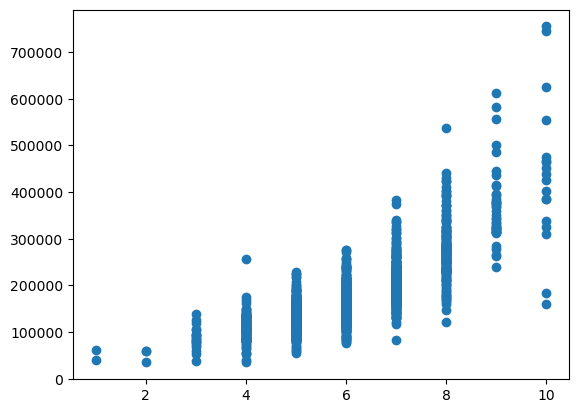

In [164]:
plt.scatter(x='OverallQual', y='SalePrice', data=train_df)

In [165]:
train_df.query("OverallQual == 10")
#maybe 524

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
58,59,60,RL,66.0,13682,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,10,2006,New,Partial,438780
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000
224,225,20,RL,103.0,13472,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,386250
389,390,60,RL,96.0,12474,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2008,New,Partial,426000
440,441,20,RL,105.0,15431,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,WD,Normal,555000
515,516,20,RL,94.0,12220,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2009,New,Partial,402861
523,524,60,RL,130.0,40094,Pave,NaN,IR1,Bnk,AllPub,...,0,NaN,NaN,NaN,0,10,2007,New,Partial,184750
583,584,75,RM,75.0,13500,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,325000
591,592,60,RL,97.0,13478,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,ConLI,Normal,451950
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000


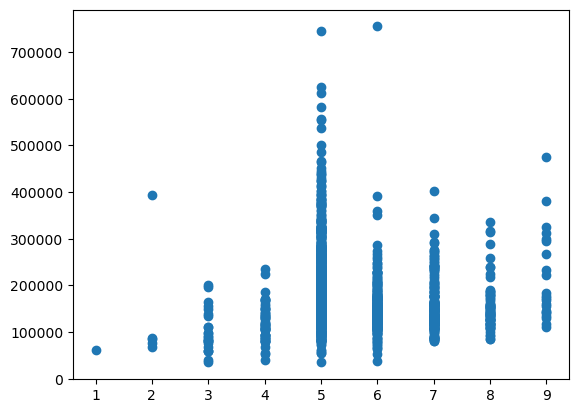

In [166]:
plt.scatter(x='OverallCond', y='SalePrice', data=train_df)

In [167]:
train_df.query("OverallCond == 9 and SalePrice > 400000")
# 379, 1183, 692, 186, 

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000


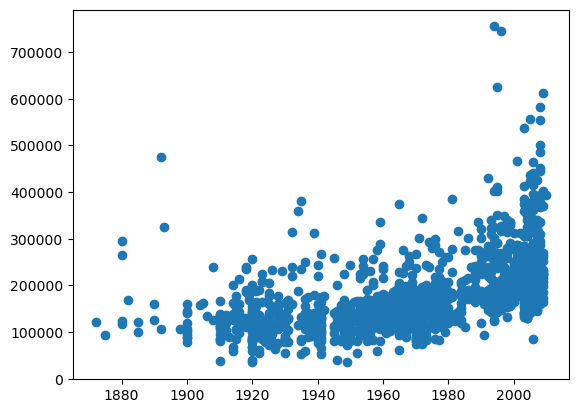

In [168]:
plt.scatter(x='YearBuilt', y='SalePrice', data=train_df)

In [169]:
train_df.query("YearBuilt < 1900 and SalePrice > 400000")
#186

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000


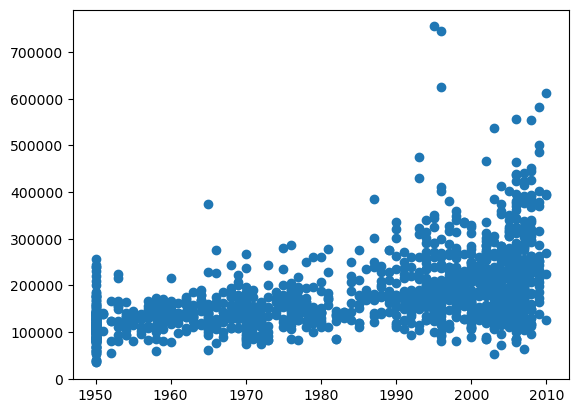

In [170]:
plt.scatter(x='YearRemodAdd', y='SalePrice', data=train_df)

In [171]:
train_df.query("YearRemodAdd < 1970 and SalePrice > 300000")
#314

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
313,314,20,RL,150.0,215245,Pave,NaN,IR3,Low,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,375000


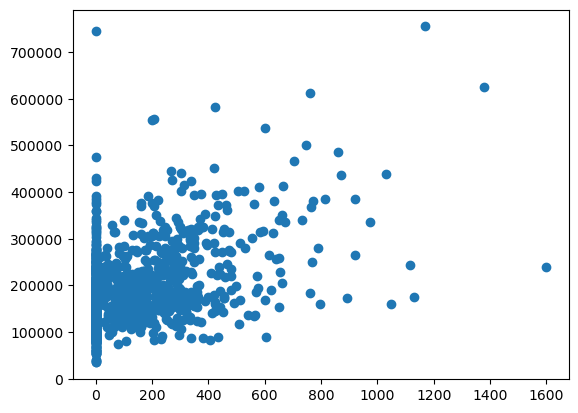

In [172]:
plt.scatter(x='MasVnrArea', y='SalePrice', data=train_df)

In [173]:
train_df.query("MasVnrArea > 1500")
#298

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
297,298,60,FV,66.0,7399,Pave,Pave,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,239000


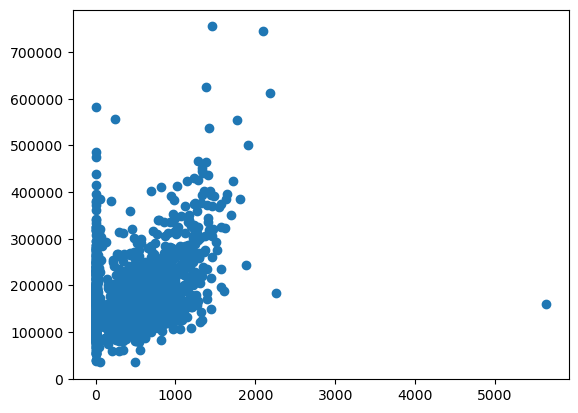

In [174]:
plt.scatter(x='BsmtFinSF1', y='SalePrice', data=train_df)

In [175]:
train_df.query("BsmtFinSF1 > 5000")
#drop 1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


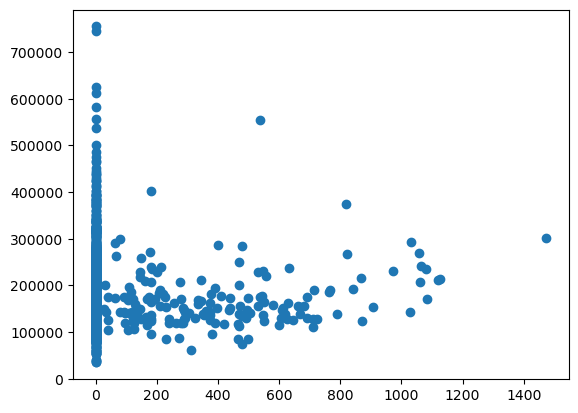

In [176]:
plt.scatter(x='BsmtFinSF2', y='SalePrice', data=train_df)

In [177]:
train_df.query("BsmtFinSF2 > 400 and SalePrice > 500000")
#441

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
440,441,20,RL,105.0,15431,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,WD,Normal,555000


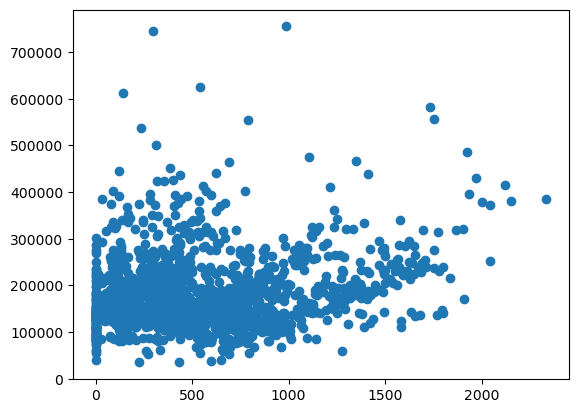

In [178]:
plt.scatter(x='BsmtUnfSF', y='SalePrice', data=train_df)

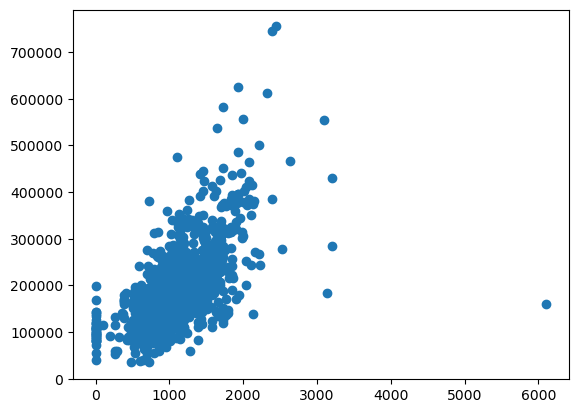

In [179]:
plt.scatter(x='TotalBsmtSF', y='SalePrice', data=train_df)

In [180]:
train_df.query("TotalBsmtSF > 6000")
#drop 1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


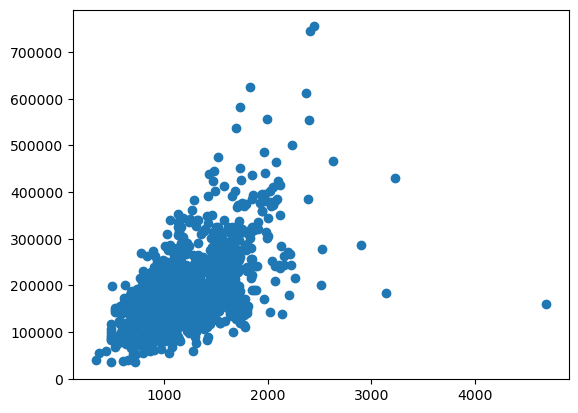

In [181]:
plt.scatter(x='1stFlrSF', y='SalePrice', data=train_df)

In [182]:
train_df[train_df['1stFlrSF'] > 4000]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


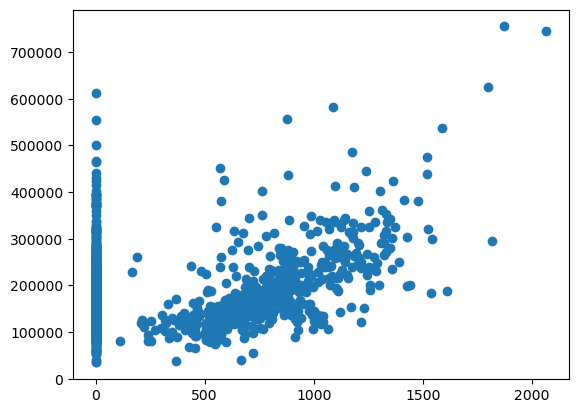

In [183]:
plt.scatter(x='2ndFlrSF', y='SalePrice', data=train_df)

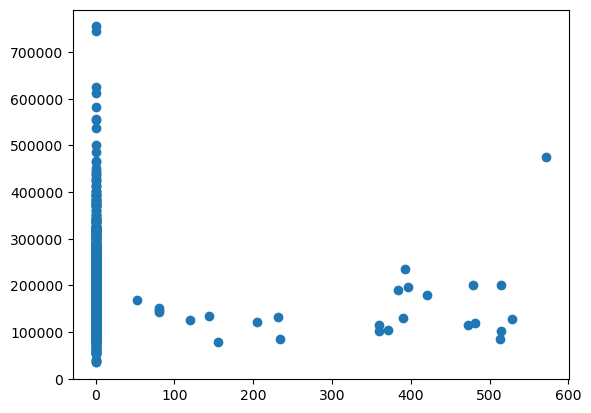

In [184]:
plt.scatter(x='LowQualFinSF', y='SalePrice', data=train_df)

In [185]:
train_df.query("LowQualFinSF > 550")
#186

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000


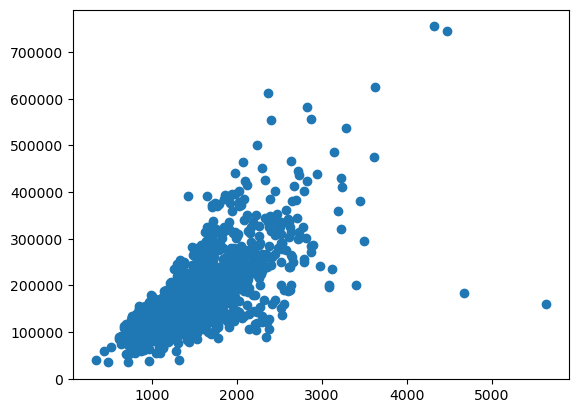

In [186]:
plt.scatter(x='GrLivArea', y='SalePrice', data=train_df)

In [187]:
train_df.query("GrLivArea > 4000 and  SalePrice < 300000")
#524, 1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
523,524,60,RL,130.0,40094,Pave,NaN,IR1,Bnk,AllPub,...,0,NaN,NaN,NaN,0,10,2007,New,Partial,184750
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


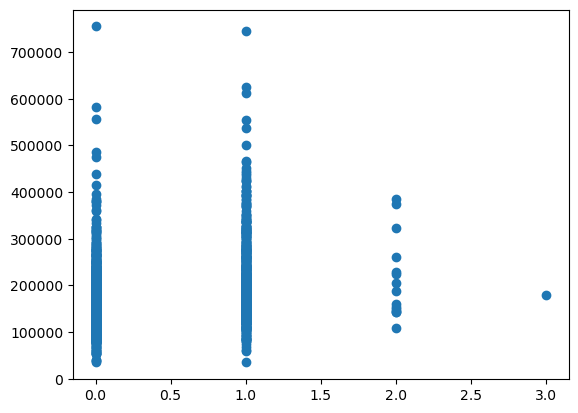

In [188]:
plt.scatter(x='BsmtFullBath', y='SalePrice', data=train_df)

In [189]:
train_df.query("BsmtFullBath == 3")
#739

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
738,739,90,RL,60.0,10800,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2009,WD,Alloca,179000


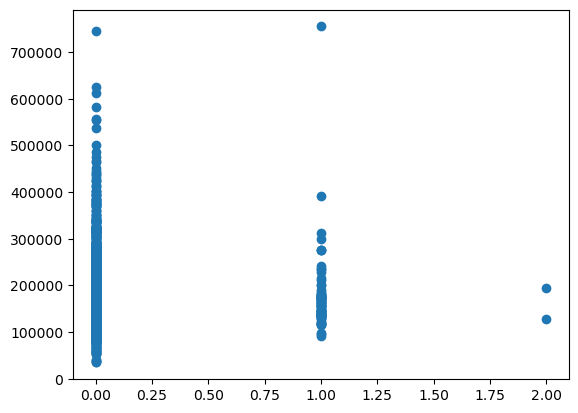

In [190]:
plt.scatter(x='BsmtHalfBath', y='SalePrice', data=train_df)

In [191]:
stats.zscore(train_df["BsmtHalfBath"]).unique()

array([-0.24106104,  3.94880935,  8.13867973])

In [192]:
train_df.query("BsmtHalfBath == 2")
#598, 955

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
597,598,120,RL,53.0,3922,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,New,Partial,194201
954,955,90,RL,35.0,9400,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2006,WD,AdjLand,127500


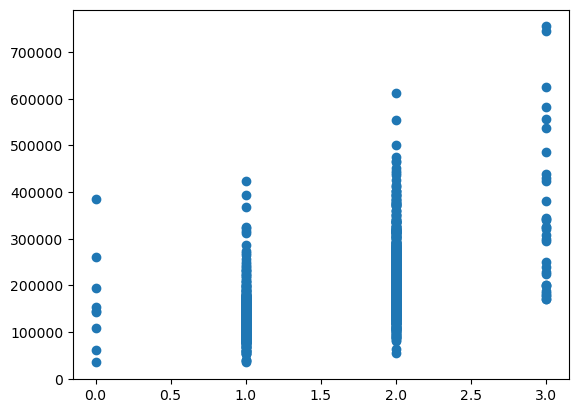

In [193]:
plt.scatter(x='FullBath', y='SalePrice', data=train_df)

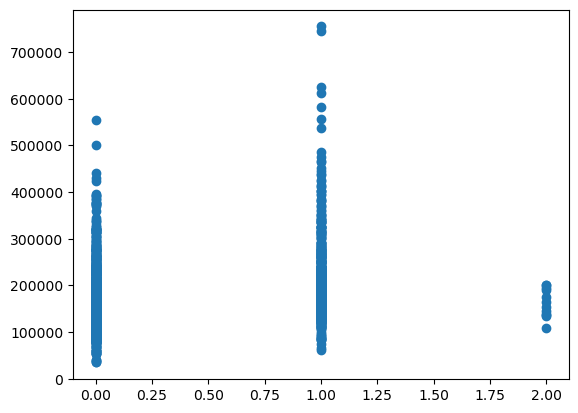

In [194]:
plt.scatter(x='HalfBath', y='SalePrice', data=train_df)

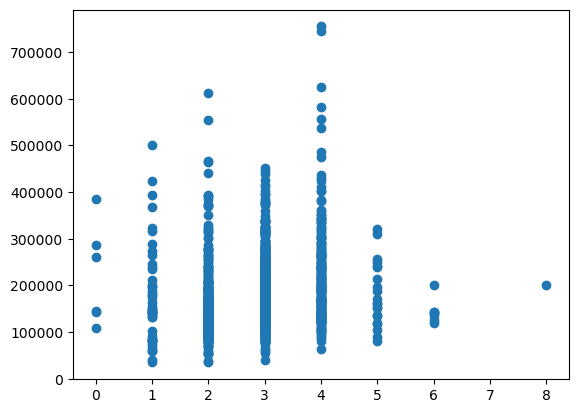

In [195]:
plt.scatter(x='BedroomAbvGr', y='SalePrice', data=train_df)

In [196]:
train_df.query("BedroomAbvGr == 8")
#636

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
635,636,190,RH,60.0,10896,Pave,Pave,Reg,Bnk,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Abnorml,200000


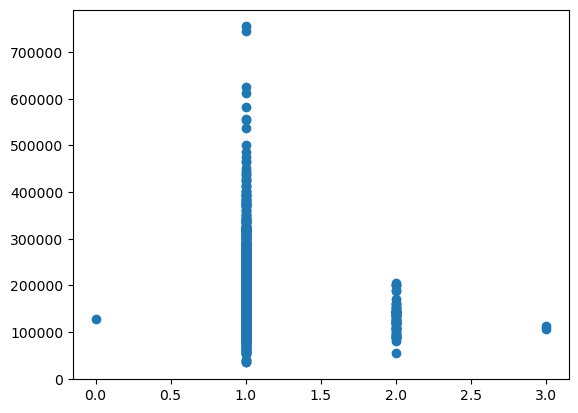

In [197]:
plt.scatter(x='KitchenAbvGr', y='SalePrice', data=train_df)

In [198]:
train_df.query("KitchenAbvGr == 3")
#49, 810

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
48,49,190,RM,33.0,4456,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,New,Partial,113000
809,810,75,RM,90.0,8100,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,11,2009,WD,Normal,106000


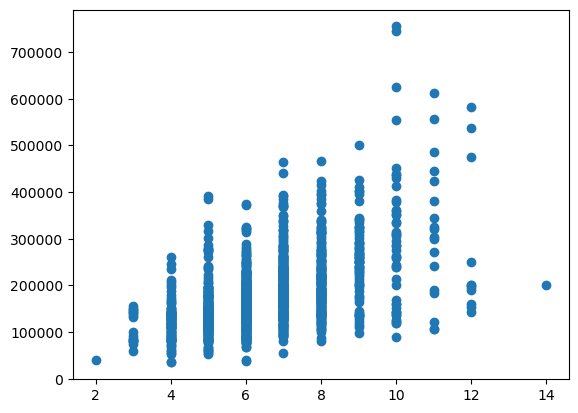

In [199]:
plt.scatter(x='TotRmsAbvGrd', y='SalePrice', data=train_df)

In [200]:
train_df.query("TotRmsAbvGrd == 14")
#636

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
635,636,190,RH,60.0,10896,Pave,Pave,Reg,Bnk,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Abnorml,200000


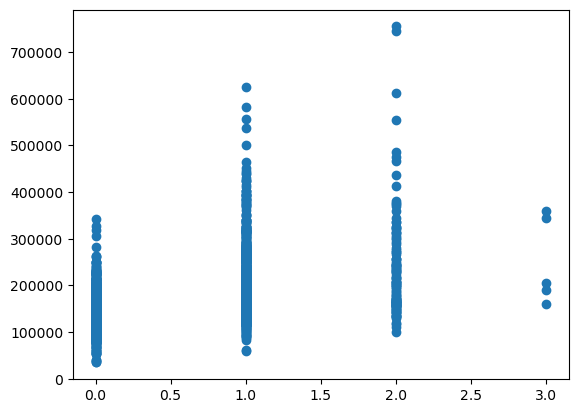

In [201]:
plt.scatter(x='Fireplaces', y='SalePrice', data=train_df)

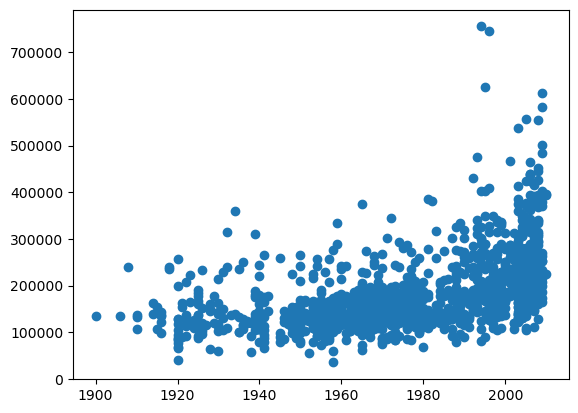

In [202]:
plt.scatter(x='GarageYrBlt', y='SalePrice', data=train_df)

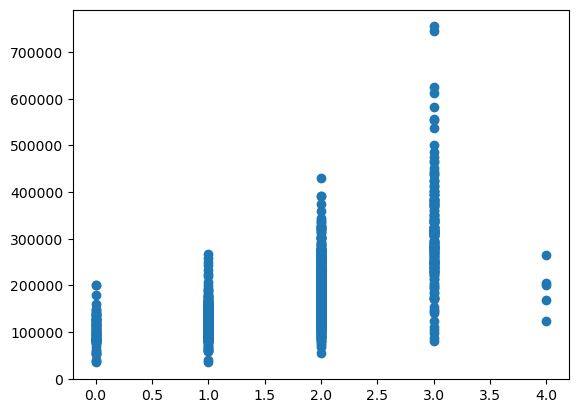

In [203]:
plt.scatter(x='GarageCars', y='SalePrice', data=train_df)

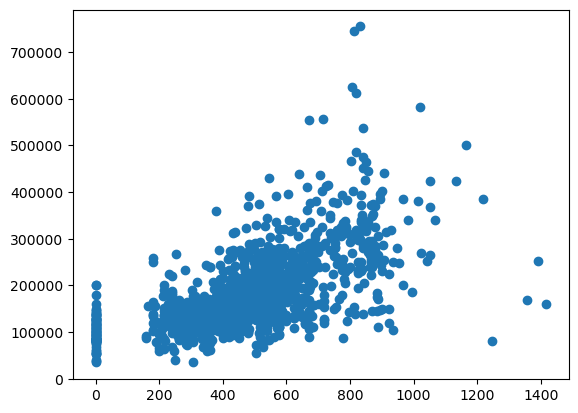

In [204]:
plt.scatter(x='GarageArea', y='SalePrice', data=train_df)

In [205]:
train_df.query("GarageArea > 1200 and SalePrice < 200000")
#1062, 1191, 1299

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1061,1062,30,C (all),120.0,18000,Grvl,NaN,Reg,Low,AllPub,...,0,NaN,NaN,Shed,560,8,2008,ConLD,Normal,81000
1190,1191,190,RL,NaN,32463,Pave,NaN,Reg,Low,AllPub,...,0,NaN,NaN,NaN,0,3,2007,WD,Normal,168000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


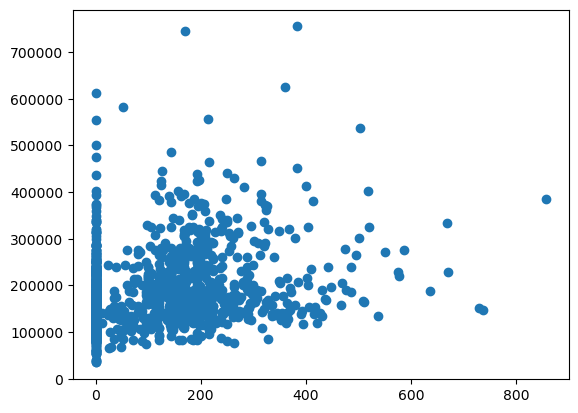

In [206]:
plt.scatter(x='WoodDeckSF', y='SalePrice', data=train_df)

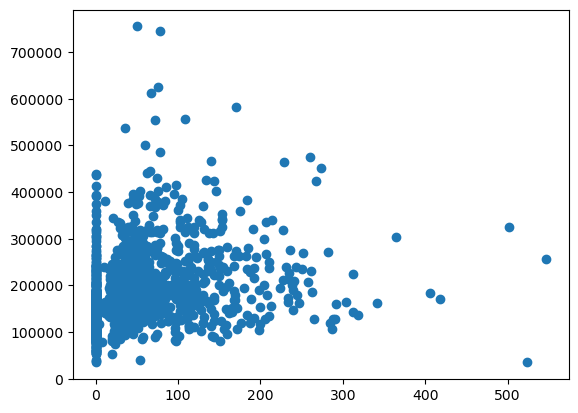

In [207]:
plt.scatter(x='OpenPorchSF', y='SalePrice', data=train_df)

In [208]:
train_df.query("OpenPorchSF > 500")
#496

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
495,496,30,C (all),60.0,7879,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdWo,NaN,0,11,2009,WD,Abnorml,34900
583,584,75,RM,75.0,13500,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2008,WD,Normal,325000
1328,1329,50,RM,60.0,10440,Pave,Grvl,Reg,Lvl,AllPub,...,0,NaN,MnPrv,Shed,1150,6,2008,WD,Normal,256000


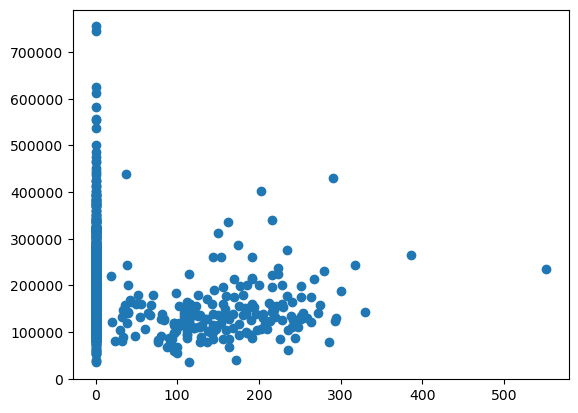

In [209]:
plt.scatter(x='EnclosedPorch', y='SalePrice', data=train_df)

In [210]:
train_df.query("EnclosedPorch > 500")
#198

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
197,198,75,RL,174.0,25419,Pave,NaN,Reg,Lvl,AllPub,...,512,Ex,GdPrv,NaN,0,3,2006,WD,Abnorml,235000


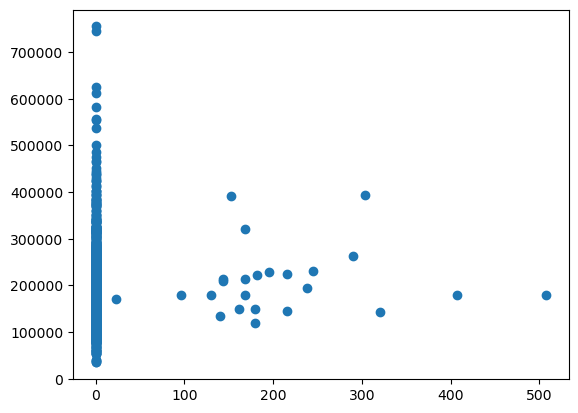

In [211]:
plt.scatter(x='3SsnPorch', y='SalePrice', data=train_df)

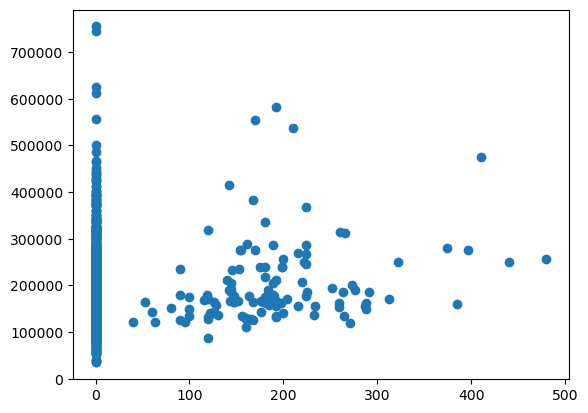

In [212]:
plt.scatter(x='ScreenPorch', y='SalePrice', data=train_df)

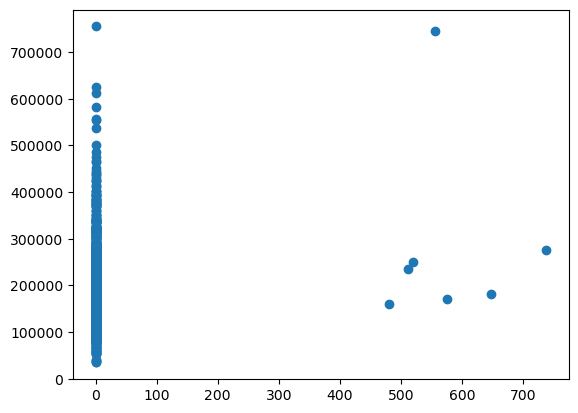

In [213]:
plt.scatter(x='PoolArea', y='SalePrice', data=train_df)

In [214]:
values = [935, 1299, 250, 314, 336, 452, 707, 1397, 524, 379, 1183, 692, 186, 298, 441, 739, 598, 955, 636, 49, 810, 1062, 1191, 496, 198]

In [215]:
train_df = train_df[train_df.Id.isin(values) == False]

In [216]:
pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False)).head(20)

,0
PoolQC,1431
MiscFeature,1384
Alley,1346
Fence,1159
MasVnrType,858
FireplaceQu,683
LotFrontage,254
GarageYrBlt,76
GarageCond,76
GarageType,76


In [217]:
#Drop PoolQC

In [218]:
train_df['MiscFeature'].unique()

array([nan, 'Shed', 'Gar2', 'Othr', 'TenC'], dtype=object)

In [219]:
train_df['Alley'].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [220]:
train_df['Alley'].fillna('No', inplace=True)
test_df['Alley'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


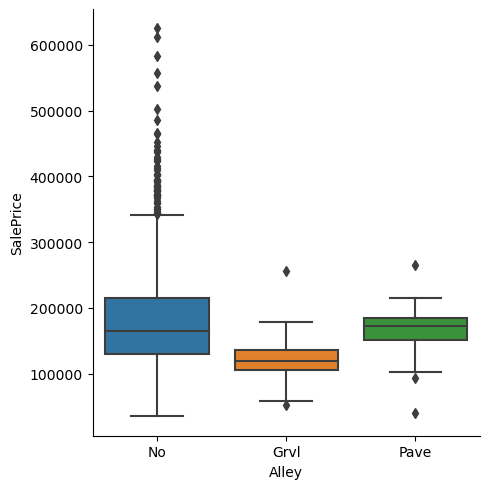

In [221]:
sns.catplot(x='Alley', y='SalePrice', data=train_df, kind='box')

In [222]:
train_df['Fence'].unique()

array([nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

In [223]:
train_df['Fence'].fillna('No', inplace=True)
test_df['Fence'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


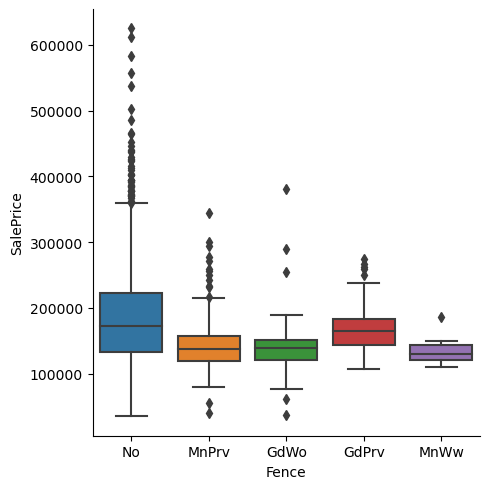

In [224]:
sns.catplot(x='Fence', y='SalePrice', data=train_df, kind='box')

In [225]:
train_df['MasVnrType'].unique()

array(['BrkFace', nan, 'Stone', 'BrkCmn'], dtype=object)

In [226]:
train_df['MasVnrType'].fillna('No', inplace=True)
test_df['MasVnrType'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


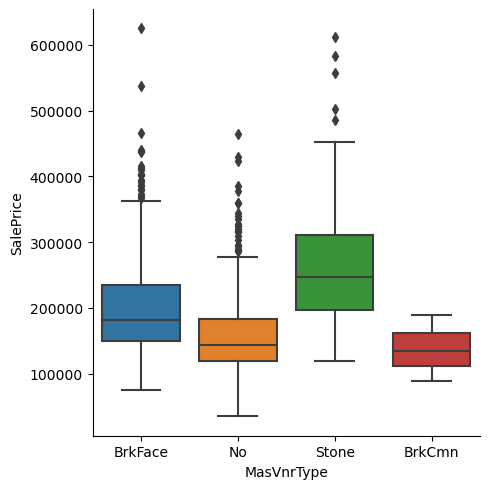

In [227]:
sns.catplot(x='MasVnrType', y='SalePrice', data=train_df, kind='box')

In [228]:
train_df['MasVnrArea'].fillna(0, inplace=True)
test_df['MasVnrArea'].fillna(0, inplace=True)

In [229]:
train_df['FireplaceQu'].unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [230]:
train_df['FireplaceQu'].fillna('No', inplace=True)
test_df['FireplaceQu'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


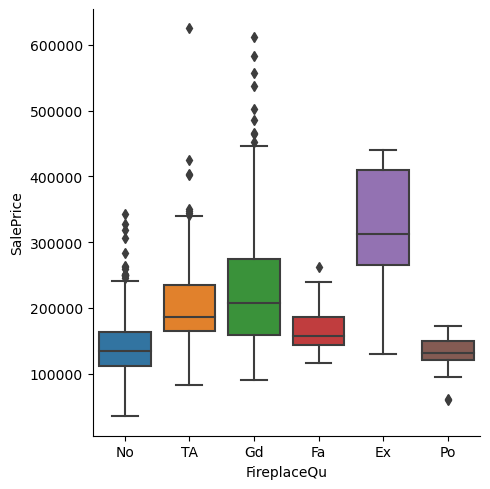

In [231]:
sns.catplot(x='FireplaceQu', y='SalePrice', data=train_df, kind='box')

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


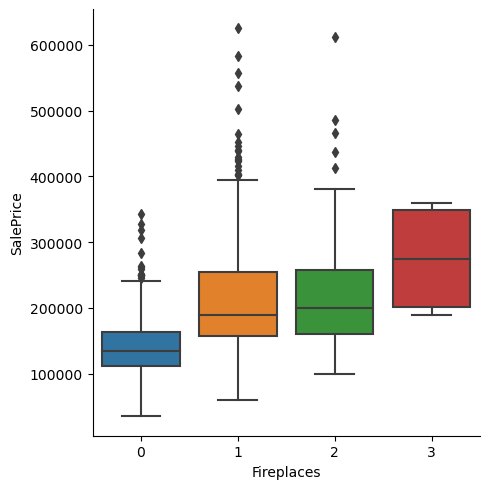

In [232]:
sns.catplot(x='Fireplaces', y='SalePrice', data=train_df, kind='box')

In [233]:
train_df['LotFrontage'].fillna(0, inplace=True)
test_df['LotFrontage'].fillna(0, inplace=True)

In [234]:
#Drop GarageYrBlt because it does not affect too much and most probably year built and garage built yr should be same.

In [235]:
train_df['GarageYrBlt'].corr(train_df['YearBuilt'])

0.8280215065429494

In [236]:
train_df['GarageCond'].unique()

array(['TA', 'Fa', nan, 'Gd', 'Po', 'Ex'], dtype=object)

In [237]:
train_df['GarageCond'].fillna('No', inplace=True)
test_df['GarageCond'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


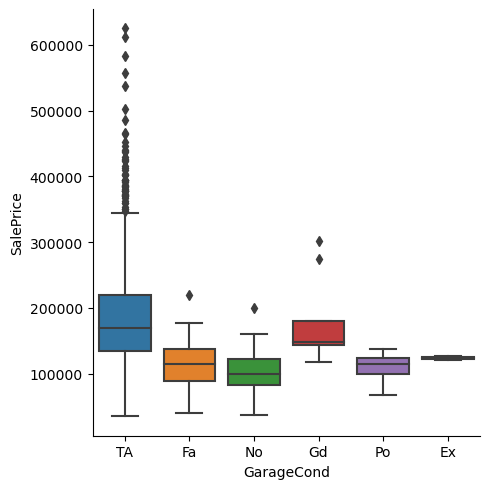

In [238]:
sns.catplot(x='GarageCond', y='SalePrice', data=train_df, kind='box')

In [239]:
train_df['GarageType'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

In [240]:
train_df['GarageType'].fillna('No', inplace=True)
test_df['GarageType'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


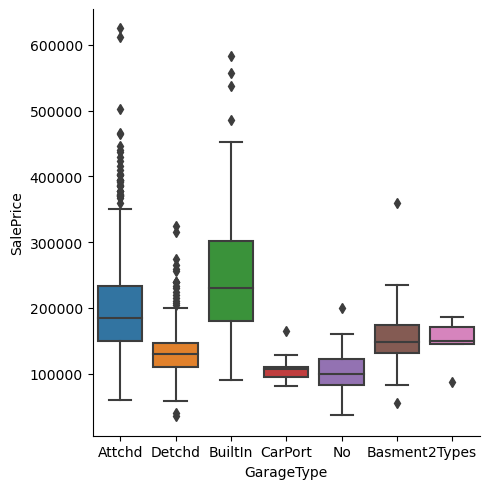

In [241]:
sns.catplot(x='GarageType', y='SalePrice', data=train_df, kind='box')

In [242]:
train_df['GarageFinish'].unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [243]:
train_df['GarageFinish'].fillna('No', inplace=True)
test_df['GarageFinish'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


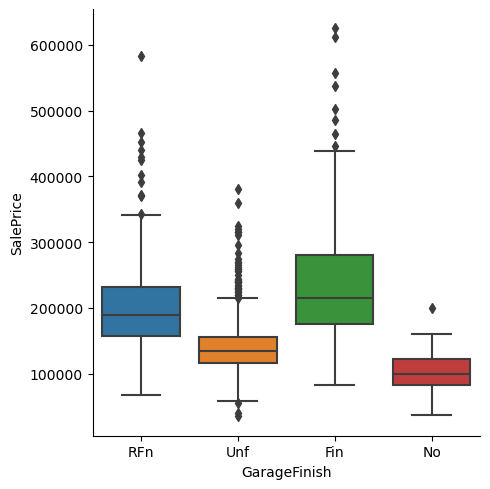

In [244]:
sns.catplot(x='GarageFinish', y='SalePrice', data=train_df, kind='box')

In [245]:
train_df['GarageQual'].unique()

array(['TA', 'Fa', 'Gd', nan, 'Po', 'Ex'], dtype=object)

In [246]:
train_df['GarageQual'].fillna('No', inplace=True)
test_df['GarageQual'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


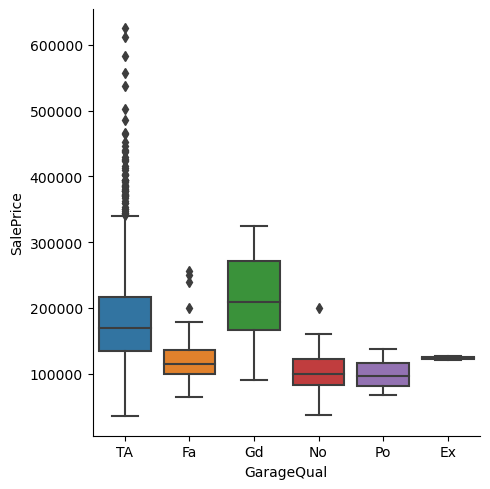

In [247]:
sns.catplot(x='GarageQual', y='SalePrice', data=train_df, kind='box')

In [248]:
train_df['BsmtFinType2'].unique()

array(['Unf', 'BLQ', nan, 'ALQ', 'Rec', 'LwQ', 'GLQ'], dtype=object)

In [249]:
train_df['BsmtFinType2'].fillna('No', inplace=True)
test_df['BsmtFinType2'].fillna('No', inplace=True)

In [250]:
#Might want to replace no with unfinished ie unf

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


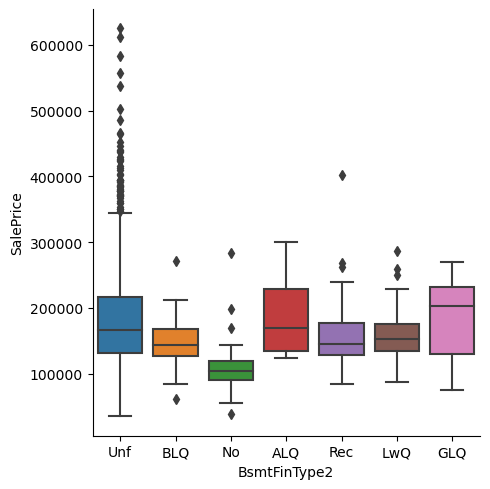

In [251]:
sns.catplot(x='BsmtFinType2', y='SalePrice', data=train_df, kind='box')

In [252]:
train_df['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [253]:
train_df['BsmtExposure'].fillna('No', inplace=True)
test_df['BsmtExposure'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


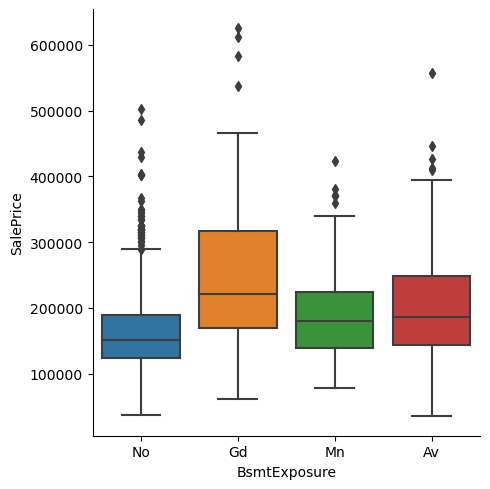

In [254]:
sns.catplot(x='BsmtExposure', y='SalePrice', data=train_df, kind='box')

In [255]:
train_df['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [256]:
train_df['BsmtQual'].fillna('No', inplace=True)
test_df['BsmtQual'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


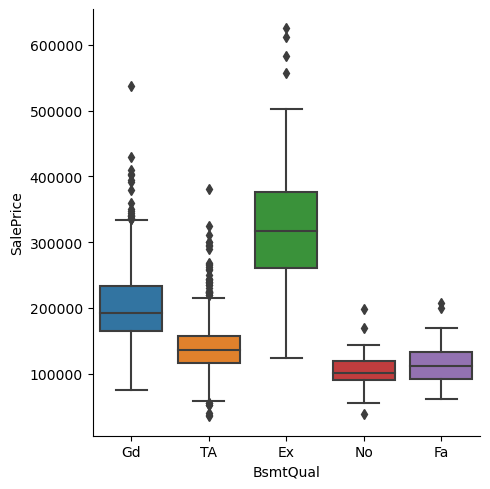

In [257]:
sns.catplot(x='BsmtQual', y='SalePrice', data=train_df, kind='box')

In [258]:
train_df['BsmtCond'].unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

In [259]:
train_df['BsmtCond'].fillna('No', inplace=True)
test_df['BsmtCond'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


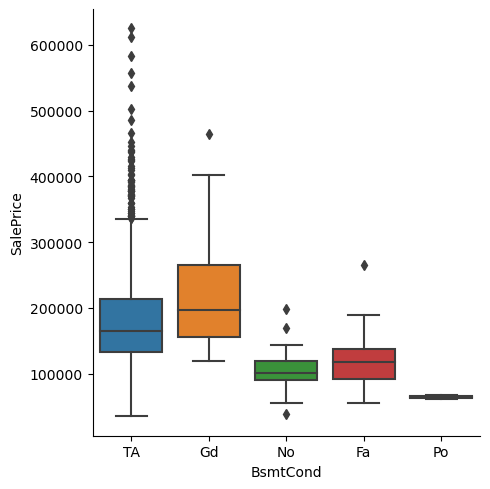

In [260]:
sns.catplot(x='BsmtCond', y='SalePrice', data=train_df, kind='box')

In [261]:
train_df['BsmtFinType1'].unique()

array(['GLQ', 'ALQ', 'Unf', 'Rec', 'BLQ', nan, 'LwQ'], dtype=object)

In [262]:
train_df['BsmtFinType1'].fillna('No', inplace=True)
test_df['BsmtFinType1'].fillna('No', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


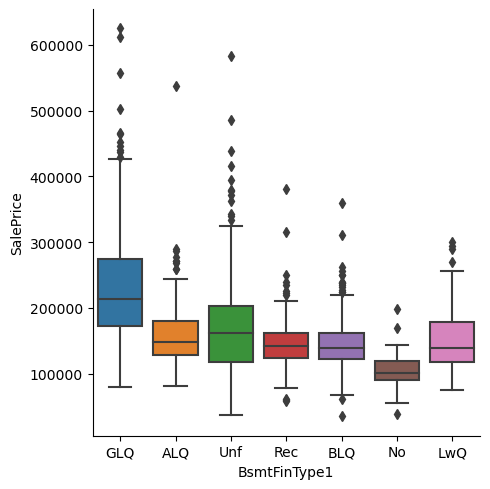

In [263]:
sns.catplot(x='BsmtFinType1', y='SalePrice', data=train_df, kind='box')

In [264]:
train_df['Electrical'].unique()

array(['SBrkr', 'FuseF', 'FuseA', 'FuseP', 'Mix', nan], dtype=object)

In [265]:
train_df['Electrical'].fillna('SBrkr', inplace=True)
test_df['Electrical'].fillna('SBrkr', inplace=True)

c:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


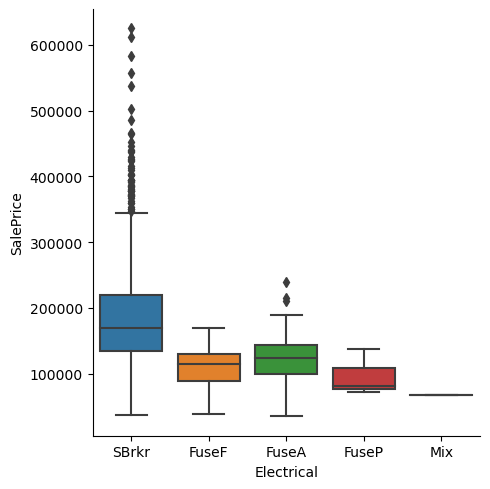

In [266]:
sns.catplot(x='Electrical', y='SalePrice', data=train_df, kind='box')

In [267]:
train_df = train_df.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'GarageYrBlt', 'GarageCond', 'BsmtFinType2'])
test_df = test_df.drop(columns=['PoolQC', 'MiscFeature', 'Alley', 'Fence', 'GarageYrBlt', 'GarageCond', 'BsmtFinType2'])

In [268]:
#Feature Engineering

In [269]:
train_df['houseage'] = train_df['YrSold'] - train_df['YearBuilt']
test_df['houseage'] = test_df['YrSold'] - test_df['YearBuilt']

In [270]:
train_df['houseremodelage'] = train_df['YrSold'] - train_df['YearRemodAdd']
test_df['houseremodelage'] = test_df['YrSold'] - test_df['YearRemodAdd']

In [271]:
train_df['totalsf'] = train_df['TotalBsmtSF'] + train_df['1stFlrSF'] + train_df['2ndFlrSF']
test_df['totalsf'] = test_df['TotalBsmtSF'] + test_df['1stFlrSF'] + test_df['2ndFlrSF']

In [272]:
train_df['totalarea'] = train_df['totalsf'] + train_df['GarageArea']
test_df['totalarea'] = test_df['totalsf'] + test_df['GarageArea']

In [273]:
train_df['totalbaths'] = train_df['FullBath'] + 0.5*(train_df['HalfBath']) + train_df['BsmtFullBath'] + 0.5*(train_df['BsmtHalfBath'])
test_df['totalbaths'] = test_df['FullBath'] + 0.5*(test_df['HalfBath']) + test_df['BsmtFullBath'] + 0.5*(test_df['BsmtHalfBath'])

In [274]:
train_df['totalporchsf'] = train_df['OpenPorchSF'] + train_df['EnclosedPorch'] + train_df['3SsnPorch'] + train_df['ScreenPorch']
test_df['totalporchsf'] = test_df['OpenPorchSF'] + test_df['EnclosedPorch'] + test_df['3SsnPorch'] + test_df['ScreenPorch']

In [275]:
train_df = train_df.drop(columns=['Id', 'YrSold', 'YearBuilt', 'YearRemodAdd', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch'])
test_df = test_df.drop(columns=['YrSold', 'YearBuilt', 'YearRemodAdd', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch'])

<Axes: >

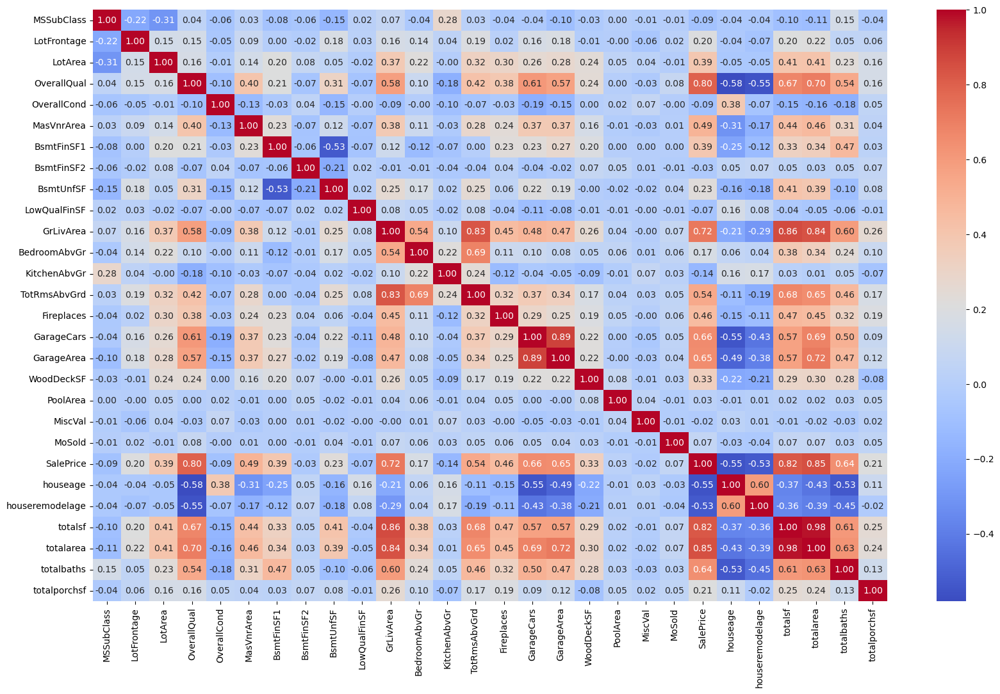

In [276]:
correlation_matrix = train_df.corr(numeric_only=True)
plt.figure(figsize=(20, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')

In [277]:
#drop garage area or garage cars

In [278]:
train_df = train_df.drop(columns=['GarageCars'])
test_df = test_df.drop(columns=['GarageCars'])

<Axes: xlabel='SalePrice', ylabel='Count'>

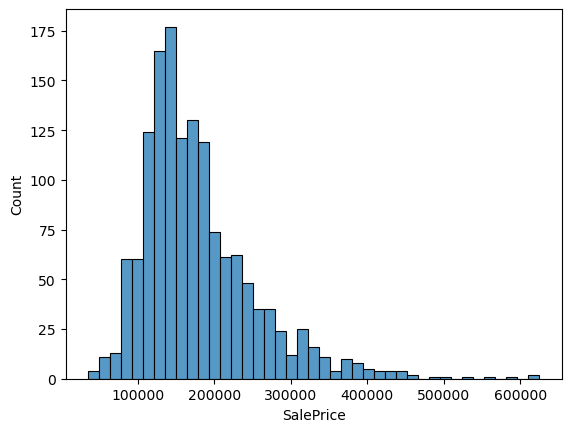

In [279]:
sns.histplot(train_df['SalePrice'])

In [280]:
train_df['SalePrice'] = np.log1p(train_df['SalePrice'])

<Axes: xlabel='SalePrice', ylabel='Count'>

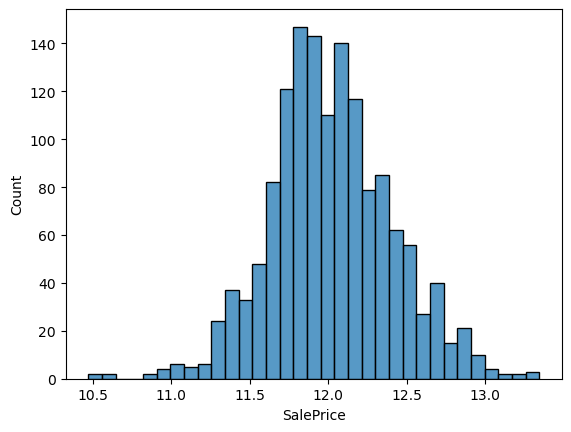

In [281]:
sns.histplot(train_df['SalePrice'])

In [282]:
train_df.dtypes[train_df.dtypes == "object"]

MSZoning         object
Street           object
LotShape         object
LandContour      object
Utilities        object
LotConfig        object
LandSlope        object
Neighborhood     object
Condition1       object
Condition2       object
BldgType         object
HouseStyle       object
RoofStyle        object
RoofMatl         object
Exterior1st      object
Exterior2nd      object
MasVnrType       object
ExterQual        object
ExterCond        object
Foundation       object
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
Heating          object
HeatingQC        object
CentralAir       object
Electrical       object
KitchenQual      object
Functional       object
FireplaceQu      object
GarageType       object
GarageFinish     object
GarageQual       object
PavedDrive       object
SaleType         object
SaleCondition    object
dtype: object

In [283]:
train_df.dtypes[train_df.dtypes != "object"]

MSSubClass           int64
LotFrontage        float64
LotArea              int64
OverallQual          int64
OverallCond          int64
MasVnrArea         float64
BsmtFinSF1           int64
BsmtFinSF2           int64
BsmtUnfSF            int64
LowQualFinSF         int64
GrLivArea            int64
BedroomAbvGr         int64
KitchenAbvGr         int64
TotRmsAbvGrd         int64
Fireplaces           int64
GarageArea           int64
WoodDeckSF           int64
PoolArea             int64
MiscVal              int64
MoSold               int64
SalePrice          float64
houseage             int64
houseremodelage      int64
totalsf              int64
totalarea            int64
totalbaths         float64
totalporchsf         int64
dtype: object

In [284]:
ode_cols = ['LotShape', 'LandContour', 'Utilities', 'LandSlope', 'BsmtQual', 'BsmtFinType1', 'CentralAir', 'Functional', 'HouseStyle', 'ExterQual', 'ExterCond', 'BsmtCond', 'BsmtExposure', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'PavedDrive'  ]

In [285]:
ohe_cols = ['Street', 'LotConfig', 'MSZoning', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'Electrical', 'GarageType', 'SaleType', 'SaleCondition' ]

In [286]:
num_cols = train_df.select_dtypes(include=['int64', 'float64']).columns
num_cols = num_cols.drop('SalePrice')

In [287]:
num_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='mean')),
    ('scale', StandardScaler())
])

In [288]:
ode_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('ordinal', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

In [289]:
ohe_pipeline = Pipeline(steps=[
    ('impute', SimpleImputer(strategy='most_frequent')),
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
])

In [290]:
col_trans = ColumnTransformer(transformers=[
    ('num_p', num_pipeline, num_cols),
    ('ode_p', ode_pipeline, ode_cols),
    ('ohe_p', ohe_pipeline, ohe_cols)
],
    remainder='passthrough',
    n_jobs=-1
    )

In [291]:
pipeline = Pipeline(steps=[
    ('preprocessing', col_trans),
])

In [292]:
x = train_df.drop('SalePrice', axis=1)
y = train_df['SalePrice']

In [293]:
x_preprocessed = pipeline.fit_transform(x)

In [294]:
x_train, x_test, y_train, y_test = train_test_split(x_preprocessed, y, test_size=0.2, random_state=25)

In [295]:
#building models

In [296]:
lr = LinearRegression()

In [297]:
lr.fit(x_train, y_train)

LinearRegression()

In [298]:
y_pred_lr = lr.predict(x_test)

In [299]:
mean_squared_error(y_test, y_pred_lr)
#as we can see we are pretty far away as expexted from linear regression because it is not good model for this dataset.

4.21261980836114e+20

In [300]:
rfr = RandomForestRegressor(random_state=13)

In [301]:
param_grid_rfr = {
    'max_depth' : [5, 10, 15],
    'n_estimators' : [100, 250, 500],
    'min_samples_split' : [3, 5, 10]
}

In [302]:
rfr_cv = GridSearchCV(rfr, param_grid_rfr, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

In [303]:
rfr_cv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=13), n_jobs=-1,
             param_grid={'max_depth': [5, 10, 15],
                         'min_samples_split': [3, 5, 10],
                         'n_estimators': [100, 250, 500]},
             scoring='neg_mean_squared_error')

In [304]:
y_pred_rfr = rfr_cv.predict(x_test)

In [305]:
mean_squared_error(y_test, y_pred_rfr, squared=False)

0.1345435389735145

In [306]:
df_test_preprocessed = pipeline.transform(test_df)

In [307]:
y_stacking = np.exp(rfr_cv.predict(df_test_preprocessed))

df_y_stacking_out = test_df[['Id']]
df_y_stacking_out['SalePrice'] = y_stacking

df_y_stacking_out.to_csv('tuned_rfr_v2.csv', index=False)

C:\Users\Rohit Phougat\AppData\Local\Temp\ipykernel_9508\3946189400.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_y_stacking_out['SalePrice'] = y_stacking


In [308]:
xgb = XGBRegressor(random_state=13)

In [309]:
param_grid_xgb = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 0.9, 1.0],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.2, 0.4],
    'colsample_bytree': [0.8, 0.9, 1.0]
}

In [310]:
xgb_cv = GridSearchCV(xgb, param_grid_xgb, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

In [311]:
xgb_cv.fit(x_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=13, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 0.9, 1.0],
                         'gamma': [0, 0.2, 0.4],
                         'learning_rate': [0.01, 0.1, 0.3],
                         'max_depth': [3, 5, 7], 'min_child_weight': [1, 3, 5],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 0.9, 1.0]},
             scoring='neg_mean_squared_error')

In [312]:
y_pred_xgb = xgb_cv.predict(x_test)

In [313]:
mean_squared_error(y_test, y_pred_xgb, squared=False)

0.12520480161149014

In [314]:
df_test_preprocessed = pipeline.transform(test_df)

In [315]:
y_stacking = np.exp(xgb_cv.predict(df_test_preprocessed))

df_y_stacking_out = test_df[['Id']]
df_y_stacking_out['SalePrice'] = y_stacking

df_y_stacking_out.to_csv('tuned_xgb_v2.csv', index=False)

C:\Users\Rohit Phougat\AppData\Local\Temp\ipykernel_9508\292706670.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_y_stacking_out['SalePrice'] = y_stacking


In [316]:
cat = CatBoostRegressor()

In [317]:
param_grid_cat = {
    'iterations': [100, 200, 300],
    'depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'l2_leaf_reg': [1, 3, 5],
    'border_count': [32, 64, 128]
}

In [318]:
cat_cv = GridSearchCV(cat, param_grid_cat, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

In [319]:
cat_cv.fit(x_train, y_train)

0:	learn: 0.3938535	total: 160ms	remaining: 15.9s
1:	learn: 0.3913163	total: 161ms	remaining: 7.9s
2:	learn: 0.3887713	total: 162ms	remaining: 5.25s
3:	learn: 0.3865777	total: 163ms	remaining: 3.91s
4:	learn: 0.3842793	total: 164ms	remaining: 3.11s
5:	learn: 0.3819498	total: 165ms	remaining: 2.58s
6:	learn: 0.3796991	total: 165ms	remaining: 2.19s
7:	learn: 0.3774074	total: 166ms	remaining: 1.91s
8:	learn: 0.3751351	total: 167ms	remaining: 1.69s
9:	learn: 0.3727594	total: 167ms	remaining: 1.51s
10:	learn: 0.3703804	total: 168ms	remaining: 1.36s
11:	learn: 0.3682041	total: 169ms	remaining: 1.24s
12:	learn: 0.3659029	total: 170ms	remaining: 1.14s
13:	learn: 0.3638624	total: 170ms	remaining: 1.05s
14:	learn: 0.3617767	total: 171ms	remaining: 970ms
15:	learn: 0.3596483	total: 172ms	remaining: 902ms
16:	learn: 0.3576148	total: 173ms	remaining: 843ms
17:	learn: 0.3554585	total: 173ms	remaining: 790ms
18:	learn: 0.3533956	total: 175ms	remaining: 745ms
19:	learn: 0.3513730	total: 176ms	remainin

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x00000165697A3E90>,
             param_grid={'border_count': [32, 64, 128], 'depth': [3, 5, 7],
                         'iterations': [100, 200, 300],
                         'l2_leaf_reg': [1, 3, 5],
                         'learning_rate': [0.01, 0.1, 0.3]},
             scoring='neg_mean_squared_error')

In [320]:
y_pred_cat = cat_cv.predict(x_test)

In [321]:
mean_squared_error(y_test, y_pred_cat, squared=False)

0.11695465900785644

In [322]:
df_test_preprocessed = pipeline.transform(test_df)

In [323]:
y_stacking = np.exp(cat_cv.predict(df_test_preprocessed))

df_y_stacking_out = test_df[['Id']]
df_y_stacking_out['SalePrice'] = y_stacking

df_y_stacking_out.to_csv('tuned_cat_v2.csv', index=False)

C:\Users\Rohit Phougat\AppData\Local\Temp\ipykernel_9508\719392231.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_y_stacking_out['SalePrice'] = y_stacking


In [345]:
rd = Ridge()

In [346]:
param_grid_rd = {
    'alpha' : [0.1, 1, 10],
    'solver' : ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
    'tol': [1e-3, 1e-4, 1e-5]
}

In [347]:
rd_cv = GridSearchCV(rd, param_grid_rd, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

In [348]:
rd_cv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [0.1, 1, 10],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg', 'sag', 'saga'],
                         'tol': [0.001, 0.0001, 1e-05]},
             scoring='neg_mean_squared_error')

In [349]:
y_pred_rd = rd_cv.predict(x_test)

In [350]:
mean_squared_error(y_test, y_pred_rd, squared=False)

0.11604286280183003

In [351]:
df_test_preprocessed = pipeline.transform(test_df)

In [352]:
y_stacking = np.exp(rd_cv.predict(df_test_preprocessed))

df_y_stacking_out = test_df[['Id']]
df_y_stacking_out['SalePrice'] = y_stacking

df_y_stacking_out.to_csv('rd_predictions_v2.csv', index=False)

C:\Users\Rohit Phougat\AppData\Local\Temp\ipykernel_9508\2074616570.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_y_stacking_out['SalePrice'] = y_stacking


In [334]:
gbr = GradientBoostingRegressor()

In [335]:
param_grid_gbr = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 0.9, 1.0],
    'min_samples_split': [2, 5, 10]
}

In [336]:
gbr_cv = GridSearchCV(gbr, param_grid_gbr, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

In [337]:
gbr_cv.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingRegressor(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.3],
                         'max_depth': [3, 5, 7],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 0.9, 1.0]},
             scoring='neg_mean_squared_error')

In [338]:
y_pred_gbr = gbr_cv.predict(x_test)

In [342]:
np.sqrt(-1 * gbr_cv.best_score_)

0.11825532934754521

In [339]:
mean_squared_error(y_test, y_pred_gbr, squared=False)

0.12067381724910693

In [340]:
df_test_preprocessed = pipeline.transform(test_df)

In [341]:
y_stacking = np.exp(rd_cv.predict(df_test_preprocessed))

df_y_stacking_out = test_df[['Id']]
df_y_stacking_out['SalePrice'] = y_stacking

df_y_stacking_out.to_csv('gbr_predictions.csv', index=False)

C:\Users\Rohit Phougat\AppData\Local\Temp\ipykernel_9508\842420427.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_y_stacking_out['SalePrice'] = y_stacking


In [353]:
vr = VotingRegressor([('gbr' , gbr_cv.best_estimator_),
                      ('xgb' , xgb_cv.best_estimator_),
                      ('cat' , cat_cv.best_estimator_),
                      ('rd' , rd_cv.best_estimator_)],
                     weights=[1, 2, 3, 1]
                      )

In [354]:
vr.fit(x_train, y_train)

0:	learn: 0.3707217	total: 972us	remaining: 291ms
1:	learn: 0.3490603	total: 2.31ms	remaining: 345ms
2:	learn: 0.3290869	total: 3.16ms	remaining: 313ms
3:	learn: 0.3125143	total: 3.94ms	remaining: 292ms
4:	learn: 0.2957615	total: 4.66ms	remaining: 275ms
5:	learn: 0.2815338	total: 5.41ms	remaining: 265ms
6:	learn: 0.2676124	total: 6.15ms	remaining: 257ms
7:	learn: 0.2551321	total: 6.89ms	remaining: 252ms
8:	learn: 0.2436955	total: 7.64ms	remaining: 247ms
9:	learn: 0.2347357	total: 8.35ms	remaining: 242ms
10:	learn: 0.2253207	total: 9.64ms	remaining: 253ms
11:	learn: 0.2167580	total: 10.4ms	remaining: 249ms
12:	learn: 0.2096557	total: 11.1ms	remaining: 245ms
13:	learn: 0.2018328	total: 11.8ms	remaining: 242ms
14:	learn: 0.1949196	total: 12.6ms	remaining: 239ms
15:	learn: 0.1883011	total: 13.3ms	remaining: 236ms
16:	learn: 0.1822344	total: 14ms	remaining: 233ms
17:	learn: 0.1775264	total: 14.7ms	remaining: 231ms
18:	learn: 0.1728218	total: 15.4ms	remaining: 228ms
19:	learn: 0.1688759	tota

VotingRegressor(estimators=[('gbr',
                             GradientBoostingRegressor(n_estimators=200,
                                                       subsample=0.8)),
                            ('xgb',
                             XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=0.8, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=0, grow_policy=None,
                                          i...
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=3,
                                          max_leaves=None, min_child_weight=5,
                                          missing=nan,
                                          monotone_constraints=None,
                                          multi_strategy=None, n_estimators=200,
                                          n_jobs=None, num_parallel_tree=None,
                                          random_state=13, ...)),
                            ('cat',
                             <catboost.core.CatBoostRegressor object at 0x00000165697D1A90>),
                            ('rd', Ridge(alpha=10, solver='saga', tol=0.001))],
                weights=[1, 2, 3, 1])

In [355]:
y_pred_vr = vr.predict(x_test)

In [356]:
mean_squared_error(y_test, y_pred_vr, squared=False)

0.11629644502750966

In [357]:
df_test_preprocessed = pipeline.transform(test_df)

In [358]:
y_stacking = np.exp(vr.predict(df_test_preprocessed))

df_y_stacking_out = test_df[['Id']]
df_y_stacking_out['SalePrice'] = y_stacking

df_y_stacking_out.to_csv('vr_predictions.csv', index=False)

C:\Users\Rohit Phougat\AppData\Local\Temp\ipykernel_9508\1140990886.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_y_stacking_out['SalePrice'] = y_stacking
